In [59]:
import os
import time
import base64
from IPython.display import Image, display, Markdown

img_dir = "./img"

# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = os.path.join(folder, filename)
        if img is not None:
            images.append(img)
    return images

In [80]:
!pip install instructor --quiet


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [77]:
from functools import lru_cache
from textwrap import dedent
import openai
import instructor
from pydantic import BaseModel, Field
from tenacity import retry, stop_after_attempt, wait_fixed

client = instructor.patch(openai.OpenAI(), mode=instructor.Mode.MD_JSON)


class ProcessedImage(BaseModel):
    title: str = Field(
        ...,
        description="The title of the image. Include any summary that can help someone find the image in a database.",
    )
    description: str = Field(
        ...,
        description="The description of the image. Include any summary that can help someone find the image in a database.",
    )
    additional_markdown_notes: str = Field(
        ...,
        description="Any additional notes and extracted features that can help someone understand the image better. Use Markdown",
    )
    markdown_tables: str = Field(
        ...,
        description="Any number of the tables extracted for the image in markdown. include any table that can help someone understand the image better.",
    )

    def display(self):
        report = f"## {self.title}\n{self.description}\n{self.additional_markdown_notes}\n{self.markdown_tables}"
        display(Markdown(dedent(report)))


@lru_cache(maxsize=32)
@retry(stop=stop_after_attempt(3), wait=wait_fixed(2), reraise=True)
def process_image(img) -> ProcessedImage:
    print("Processing image: ", img)
    base_url = encode_image(img)
    image_url = f"data:image/jpeg;base64,{base_url}"
    start = time.time()
    resp = client.chat.completions.create(
        model="gpt-4-vision-preview",
        max_tokens=4000, 
        max_retries=2,
        response_model=ProcessedImage,
        temperature=0,
        messages=[
            {
                "role": "system",
                "content": (
                    """
                    You are world class construction engineer and you are working on a new project
                    You have a new image of a construction site and you must describe the image and extract the features of the image.
                    Include any summary that can help someone find the image in a database.
                    Include any features that can help someone understand the image better.
                    """
                ),
            },
            {
                "role": "user",
                "content": [
                    {
                        "type": "text",
                        "text": f"Return a correctly extracted image and its features. according to {ProcessedImage.model_json_schema()}",
                    },
                    *[{"type": "image_url", "image_url": image_url}],
                ],
            },
        ],
    )
    end = time.time()
    print(f"Time taken: {end - start:.2f} seconds")
    return resp

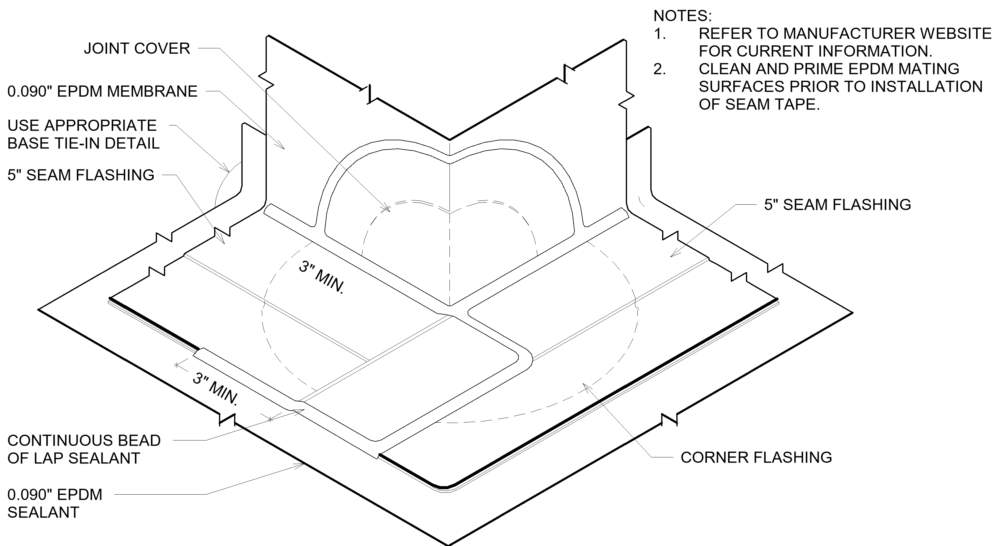

Processing image:  ./img/b3a3b2cb-82d5-41cc-b336-b25099e839f2-00159e0d - Drafting View - EPDM OUTSIDE CORNER FLASHING.png
Time taken: 17.14 seconds


## EPDM Roofing Detail Diagram
Technical drawing of an EPDM membrane roofing detail, including joint cover, seam flashing, and sealant application.
### Features:
- **Joint Cover**: Protects the roofing membrane at the joint.
- **0.090" EPDM Membrane**: Indicates the thickness of the EPDM membrane used.
- **5" Seam Flashing**: Details the width of the seam flashing to be used.
- **Continuous Bead of Lap Sealant**: Specifies the application of sealant along the seam for waterproofing.
- **Corner Flashing**: Additional flashing used at the corners for enhanced protection.

### Notes:
1. Reference to the manufacturer's website for current information is advised.
2. Instructions to clean and prime EPDM mating surfaces prior to the installation of seam tape.

This diagram is essential for ensuring proper installation and waterproofing of EPDM roofing systems.
| Component | Description |
| --- | --- |
| Joint Cover | Protects the roofing membrane at the joint |
| 0.090" EPDM Membrane | Thickness of the EPDM membrane used |
| 5" Seam Flashing | Width of the seam flashing to be used |
| Continuous Bead of Lap Sealant | Application of sealant along the seam for waterproofing |
| Corner Flashing | Additional flashing used at the corners for enhanced protection |

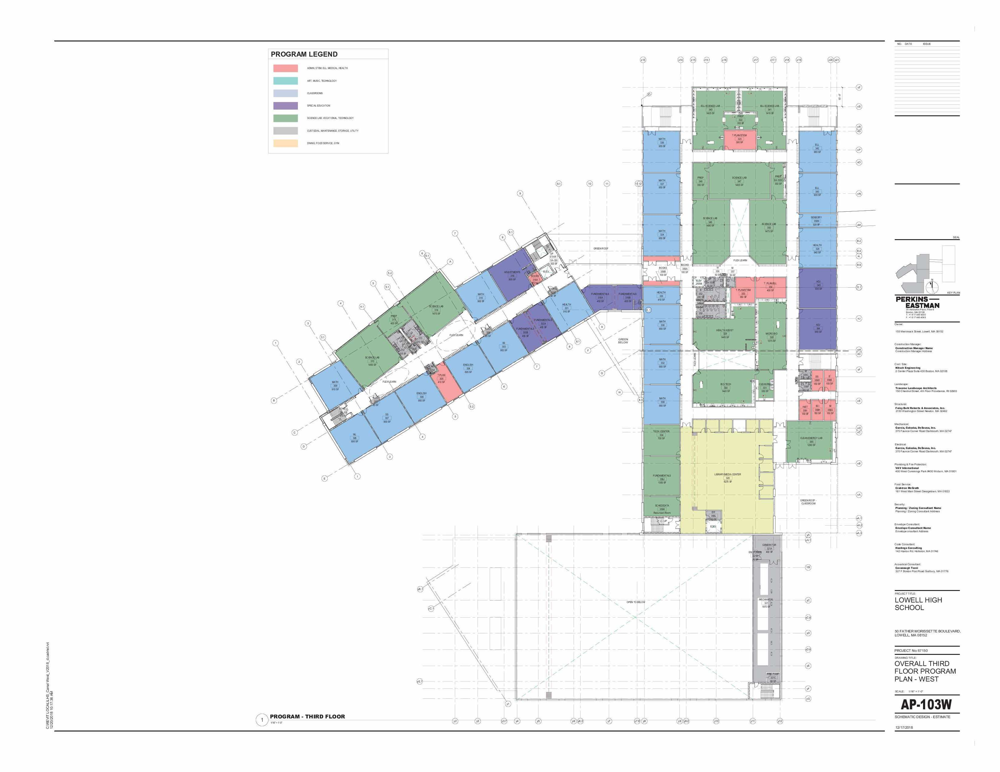

Processing image:  ./img/lhs binder-page 439.jpg
Time taken: 12.82 seconds


## Architectural Floor Plan for Lowell High School
This image depicts an architectural floor plan for the third level of Lowell High School, showcasing various rooms and spaces with a color-coded program legend.
### Key Features:
- **Program Legend**: Color-coded to indicate different types of rooms such as classrooms, science labs, special education, etc.
- **Detailed Labels**: Each room is labeled with a number and sometimes a specific use.
- **Scale and Orientation**: The plan includes a graphical scale and north arrow for orientation.
- **Architectural Firm**: The plan is attributed to Perkins Eastman, an architectural firm.
- **Document Details**: Title block includes the project name, floor level, plan identification code (AP-103W), and date (January 2020).

| Program Legend | Color | Room Type |
|----------------|-------|-----------|
| Light Purple   |       | Classroom |
| Dark Purple    |       | Science Lab |
| Light Green    |       | Special Education |
| Dark Green     |       | Art/Performing Arts |
| Yellow         |       | Administration |
| Red            |       | Mechanical/Electrical/Plumbing |
| Blue           |       | Common Areas |
| Gray           |       | Circulation |


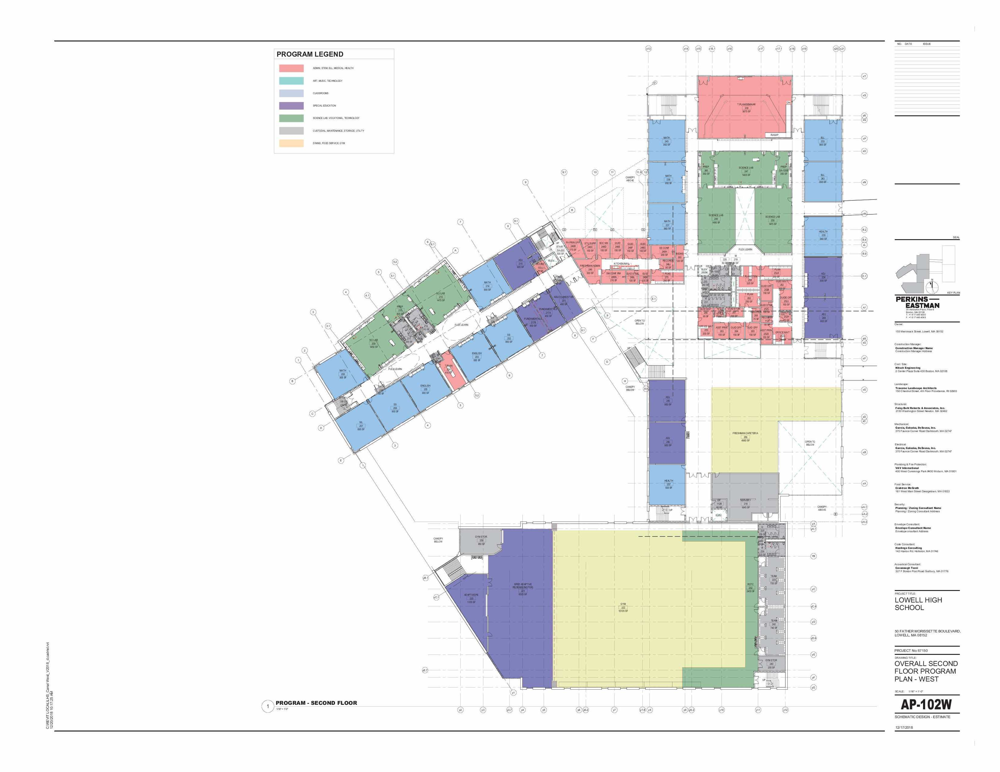

Processing image:  ./img/lhs binder-page 438.jpg
Time taken: 21.67 seconds


## Architectural Floor Plan for Lowell High School Second Floor
A detailed architectural floor plan of the second floor of Lowell High School, showing various sections and room layouts.
### Features of the Floor Plan
- **Program Legend**: Color-coded key indicating different areas such as mechanical, electrical, plumbing, and fire protection.
- **Detailed Room Layout**: Each room is marked with a number and color corresponding to its function.
- **Designation**: The plan is labeled as 'PROGRAM - SECOND FLOOR'.
- **Architectural Firm**: The plan includes the logo and name of the architectural firm 'Perkins Eastman'.
- **Scale and North Indicator**: The plan includes a scale for reference and a north directional indicator.
- **Comprehensive Index**: A detailed index on the right side of the plan lists room numbers and their corresponding functions.
| Section | Color | Function |
|---------|-------|----------|
| A | Red | Mechanical, Electrical, Plumbing, Fire Protection |
| B | Green | Unassigned/Available Space |
| C | Blue | Classroom Spaces |
| D | Yellow | Administrative Offices |
| E | Purple | Common Areas |

| Element | Description |
|---------|-------------|
| Scale | Included for reference |
| North Indicator | Provided on the plan |
| Architectural Firm | Perkins Eastman |
| Room Index | Detailed list of rooms and functions |

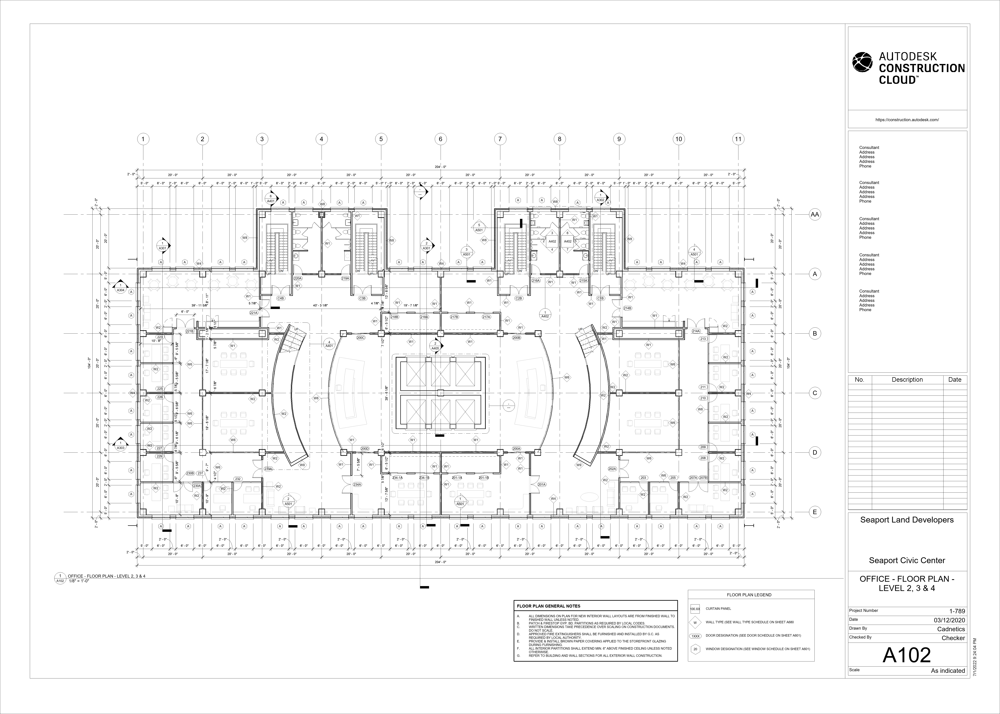

Processing image:  ./img/seaport civic center Sheet A102 - OFFICE - FLOOR PLAN - LEVEL 2 3 and 4.png
Time taken: 15.62 seconds


## Autodesk Construction Cloud - Office Floor Plan Level 2, 3 & 4
An architectural floor plan for an office building, detailing levels 2, 3, and 4, associated with the Autodesk Construction Cloud.
### Image Features
- **Title Block**: Includes project title (Seaport Civic Center), sheet title (Office - Floor Plan - Level 2, 3 & 4), sheet number (A102), and other relevant data such as the drawing date, scale, and the names of the individuals involved in the creation and checking of the plan.
- **Floor Plan**: Detailed layout showing walls, doors, windows, and furniture.
- **Annotations**: Symbols and notes indicating the types of materials, finishes, and construction methods.
- **Revision Block**: A table on the right side of the sheet that lists revisions made to the plan, with columns for revision number, description, and date.
- **General Notes**: Located at the bottom left, providing additional specifications and guidelines for the construction.
- **Legend**: Symbols and abbreviations used throughout the plan are explained in the legend for clarity.
| No. | Description | Date |
| --- | ----------- | ---- |
| 1 | Revision 1 Description | Date |
| 2 | Revision 2 Description | Date |

### Legend
| Symbol | Description |
| ------ | ----------- |
| A | Symbol A Description |
| B | Symbol B Description |

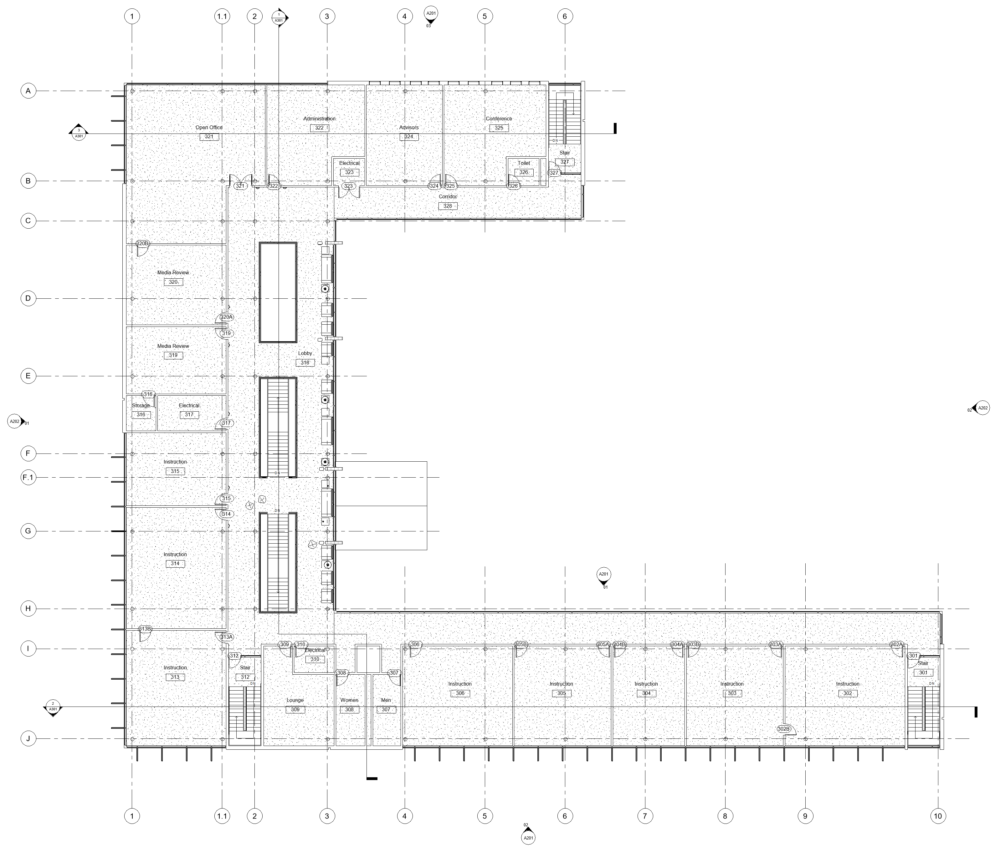

Processing image:  ./img/third-floor-plan (03 floor).png
Time taken: 20.88 seconds


## Architectural Floor Plan
The image displays a detailed architectural floor plan of a building, showing various rooms and spaces with dimensions and annotations.
### Key Features of the Floor Plan
- **Rooms and Spaces**: The plan includes multiple rooms such as offices, a library, and washrooms.
- **Annotations**: Each room and space is labeled with dimensions and specific details like 'Quiet Office' and 'Electrical Room'.
- **Symbols**: There are various symbols indicating elements like doors, windows, and electrical outlets.
- **Dimensions**: The plan shows detailed measurements for each room and corridor.
- **Scale**: A graphical scale is likely present to help understand the dimensions in real-world units.
| Room | Label | Details |
|------|-------|---------|
| 1    | Quiet Office | Specific dimensions and layout |
| 2    | Electrical Room | Location and size |
| 3    | Library | Central location and size |
| 4    | Washrooms | Number and location |
| 5    | Mechanical Room | Size and equipment space |


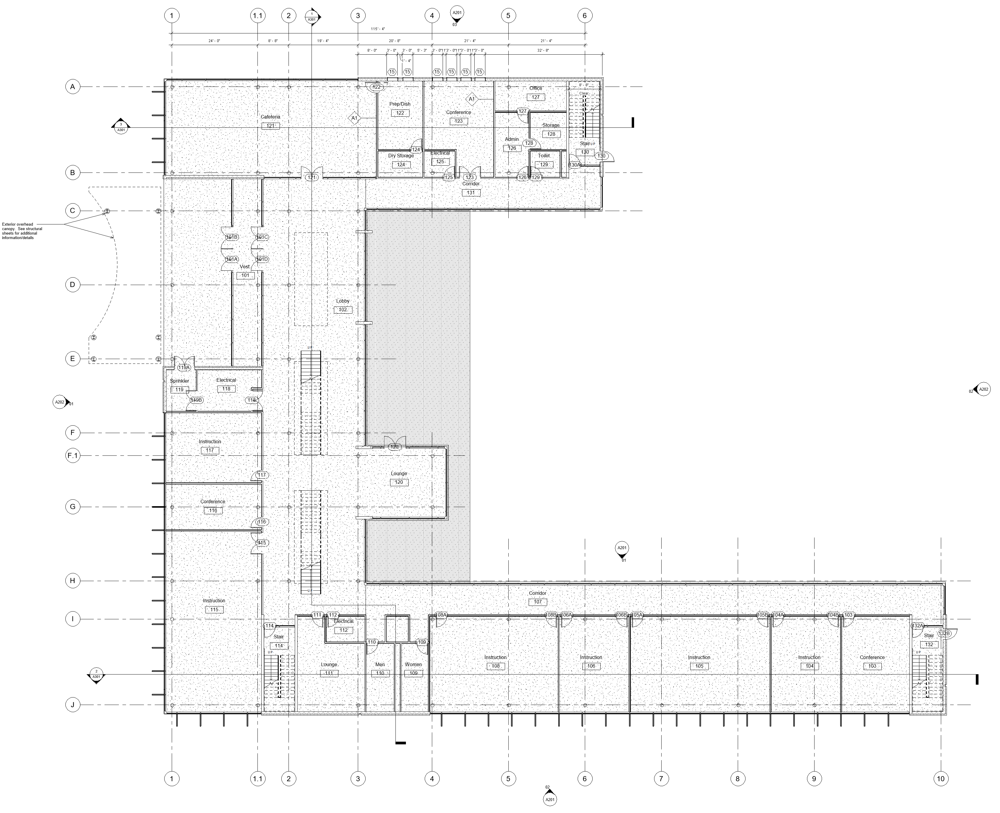

Processing image:  ./img/first floor entry level (01 floor).png
Time taken: 36.24 seconds


## Architectural Floor Plan
A detailed architectural floor plan of a multi-room building, including dimensions, room labels, and structural elements.
### Key Features:
- **Room Labels**: Each room is clearly labeled, e.g., 'Lobby', 'Conference', 'Office', etc.
- **Dimensions**: The plan includes precise measurements for various rooms and spaces.
- **Structural Elements**: Staircases, elevators, and columns are marked.
- **Annotations**: There are annotations and symbols indicating specific architectural or construction details.
- **Scale**: A graphical scale is present to understand the size of the design.

### Potential Uses:
- This floor plan could be used by architects, engineers, and construction professionals to guide the building process.
- Interior designers could use this to plan the layout of furniture and other decor.
- Facility managers might use it for maintenance planning or space management.
| Element | Description |
| --- | --- |
| Room Labels | Labels such as 'Lobby', 'Office', etc. |
| Dimensions | Numerical measurements for rooms and spaces |
| Structural Elements | Locations of stairs, elevators, and columns |
| Annotations | Symbols and notes for construction details |
| Scale | Graphical representation of the plan's scale |

Processing image:  ./img/LHS-Schematic-Design-Drawings.jpg
Processing image:  ./img/LHS-Schematic-Design-Drawings.jpg
Processing image:  ./img/LHS-Schematic-Design-Drawings.jpg
An error occured: Error code: 400 - {'error': {'message': "You uploaded an unsupported image. Please make sure your image is below 20 MB in size and is of one the following formats: ['png', 'jpeg', 'gif', 'webp'].", 'type': 'invalid_request_error', 'param': None, 'code': 'image_too_large'}}, <class 'openai.BadRequestError'>


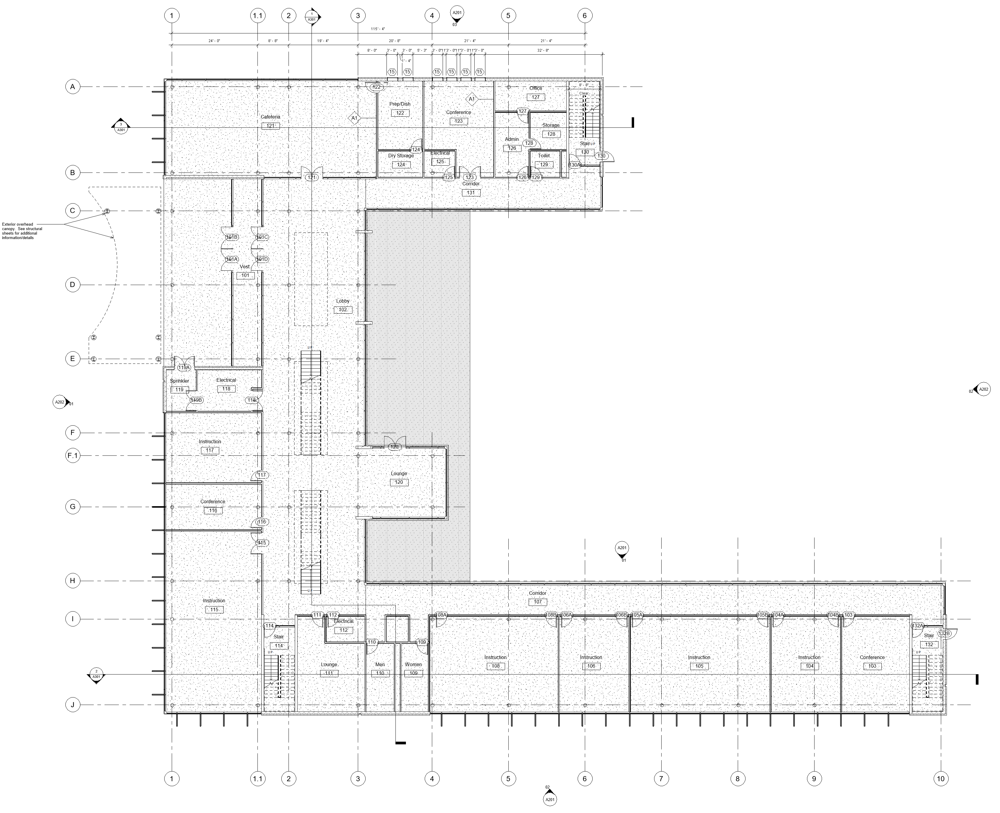

Processing image:  ./img/second floor (02 floor).png
Time taken: 9.06 seconds


## Architectural Floor Plan
Detailed architectural floor plan of a multi-room building with annotations and measurements.
The image displays a detailed architectural floor plan, which includes various rooms and spaces labeled with specific functions such as 'Lobby', 'Office', and 'Conference'. It also shows dimensions, door swings, and other construction details. Annotations and symbols indicate the location of electrical outlets, lighting fixtures, and plumbing. The plan is structured with a grid system, and each grid section is labeled with letters and numbers for easy reference.
| Grid | Room | Function |
|------|------|----------|
| A1   | C101 | Lobby    |
| A2   | C102 | Office   |
| B2   | C103 | Conference |
| C3   | C104 | Office   |

Additional details such as door types, window locations, and structural elements like columns and walls are also marked on the plan.

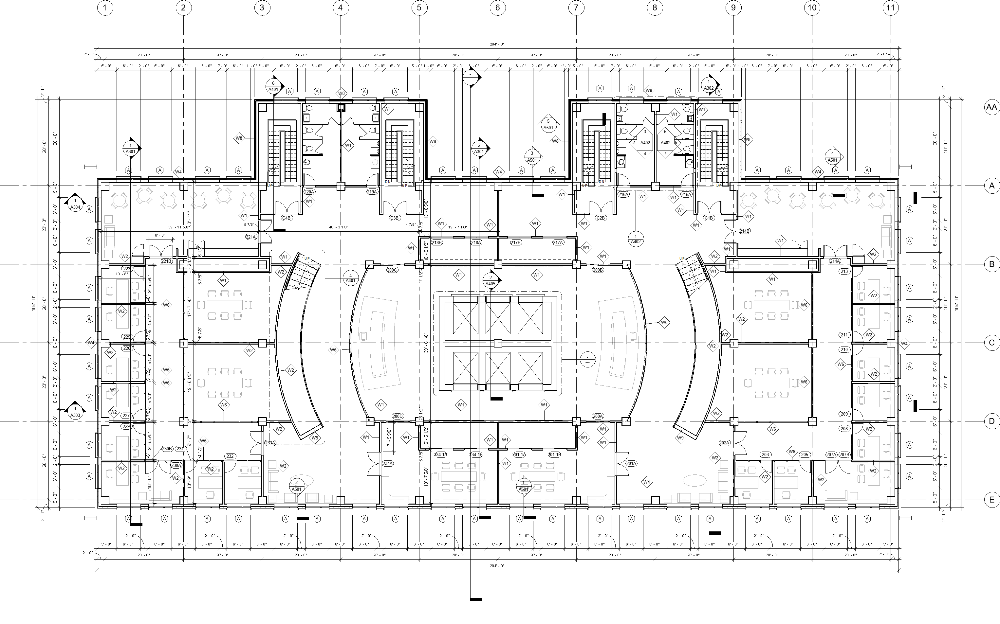

Processing image:  ./img/94968738-b5fc-4047-b6c5-825c1310a297-00138411 - Floor Plan - OFFICE - FLOOR PLAN - LEVEL 2, 3 & 4.png
Processing image:  ./img/94968738-b5fc-4047-b6c5-825c1310a297-00138411 - Floor Plan - OFFICE - FLOOR PLAN - LEVEL 2, 3 & 4.png
Processing image:  ./img/94968738-b5fc-4047-b6c5-825c1310a297-00138411 - Floor Plan - OFFICE - FLOOR PLAN - LEVEL 2, 3 & 4.png
An error occured: 1 validation error for ProcessedImage
  Invalid JSON: EOF while parsing a value at line 1 column 0 [type=json_invalid, input_value='', input_type=str]
    For further information visit https://errors.pydantic.dev/2.6/v/json_invalid, <class 'pydantic_core._pydantic_core.ValidationError'>


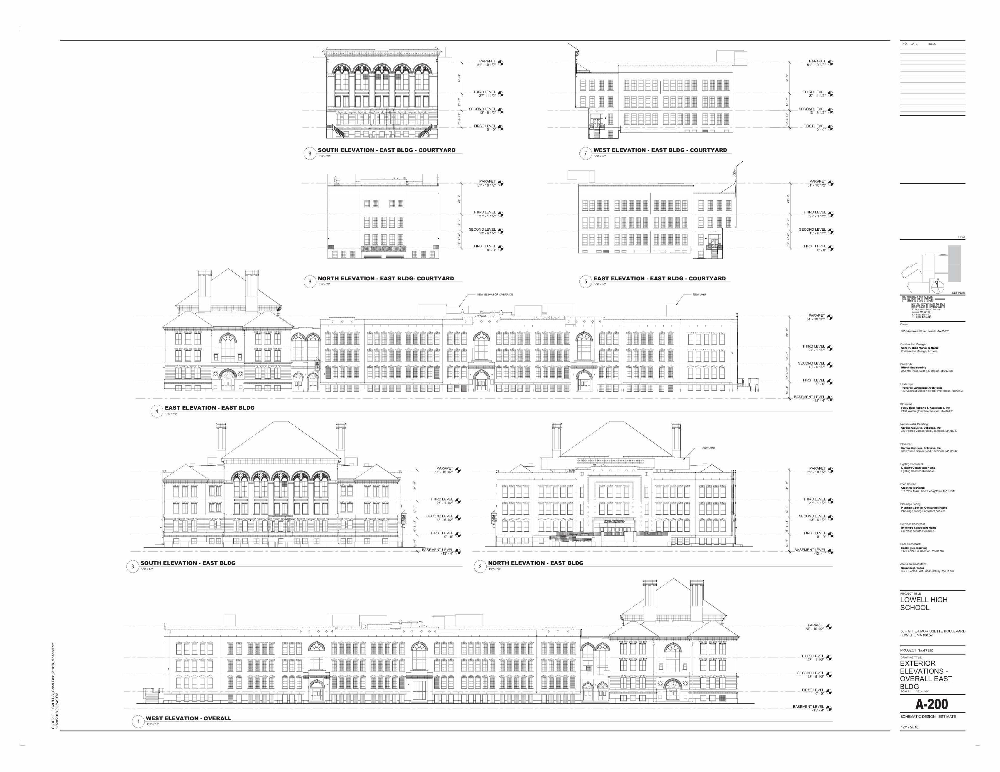

Processing image:  ./img/lhs binder-page 418.jpg
Time taken: 20.92 seconds


## Architectural Elevation Plans for Lowell High School
The image displays a set of detailed architectural elevation drawings for Lowell High School, showcasing various facades of the building.
### Image Features
- **South Elevation - East Bldg. Courtyard**: Shows the courtyard-facing side of the east building.
- **North Elevation - East Bldg. Courtyard**: Depicts the courtyard-facing side of the north elevation of the east building.
- **East Elevation - East Bldg. Courtyard**: Illustrates the east-facing elevation of the east building, including courtyard details.
- **West Elevation - East Bldg. Courtyard**: Presents the west-facing elevation of the east building, with courtyard views.
- **East Elevation - East Bldg**: Provides a view of the east-facing elevation of the east building without courtyard details.
- **South Elevation - East Bldg**: Shows the south-facing elevation of the east building.
- **North Elevation - East Bldg**: Displays the north-facing elevation of the east building.
- **West Elevation - Overall**: Offers a comprehensive view of the west elevation of the entire structure.

Each elevation is annotated with detailed measurements and design notes, which are critical for construction and renovation purposes.
| Elevation | Description |
|-----------|-------------|
| South Elevation - East Bldg. Courtyard | Courtyard-facing side of the east building |
| North Elevation - East Bldg. Courtyard | Courtyard-facing side of the north elevation of the east building |
| East Elevation - East Bldg. Courtyard | East-facing elevation of the east building, including courtyard details |
| West Elevation - East Bldg. Courtyard | West-facing elevation of the east building, with courtyard views |
| East Elevation - East Bldg | East-facing elevation of the east building without courtyard details |
| South Elevation - East Bldg | South-facing elevation of the east building |
| North Elevation - East Bldg | North-facing elevation of the east building |
| West Elevation - Overall | Comprehensive view of the west elevation of the entire structure |

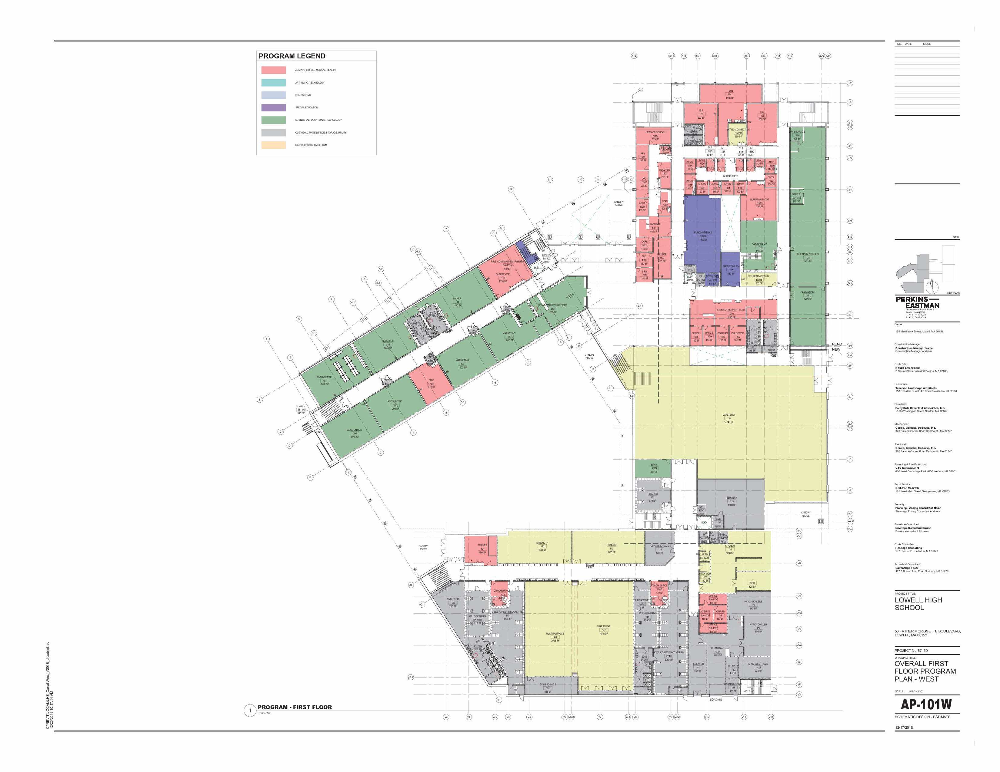

Processing image:  ./img/lhs binder-page 437.jpg
Processing image:  ./img/lhs binder-page 437.jpg
Processing image:  ./img/lhs binder-page 437.jpg
An error occured: 1 validation error for ProcessedImage
  Invalid JSON: EOF while parsing a value at line 1 column 0 [type=json_invalid, input_value='', input_type=str]
    For further information visit https://errors.pydantic.dev/2.6/v/json_invalid, <class 'pydantic_core._pydantic_core.ValidationError'>


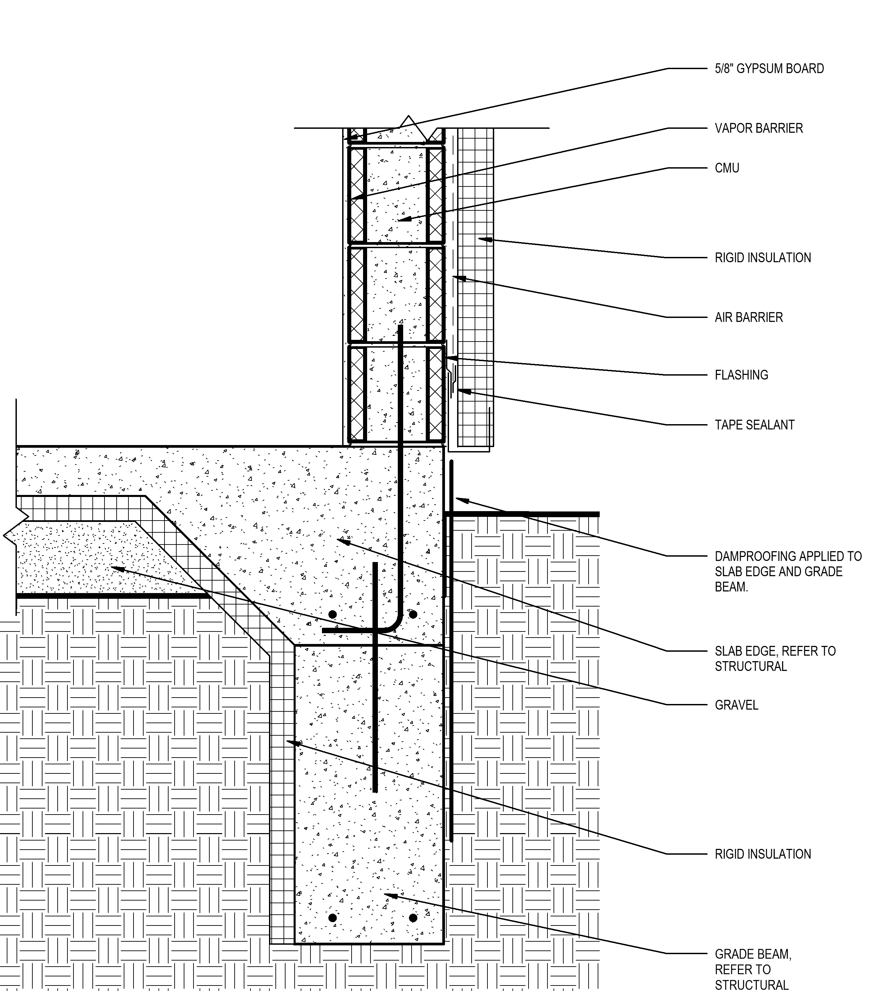

Processing image:  ./img/b3ac8313-71ac-4cfd-afdb-6741a492bbdb-00033f29 - Detail View - A82 - CMU BASE.png
Time taken: 27.26 seconds


## Construction Detail Diagram
A technical drawing of a construction detail showing the cross-section of a wall and foundation interface.
The image is a black and white technical diagram detailing the components of a building's wall and foundation system. It includes labels for various construction materials such as gypsum board, vapor barrier, CMU (concrete masonry unit), rigid insulation, air barrier, flashing, tape sealant, damp proofing, slab edge, gravel, and grade beam. The diagram is detailed and provides a clear understanding of the layering and materials used in construction for insulation and protection against moisture.
| Layer | Material | Description |
| --- | --- | --- |
| Exterior Finish | 5/8" Gypsum Board | Outermost layer of the wall |
| Vapor Control | Vapor Barrier | Prevents moisture ingress |
| Wall Structure | CMU | Concrete masonry unit providing structural support |
| Insulation | Rigid Insulation | Insulates the building envelope |
| Air Sealing | Air Barrier | Seals the building from air leaks |
| Moisture Protection | Flashing | Directs water away from critical areas |
| Sealant | Tape Sealant | Provides additional sealing at joints |
| Foundation Waterproofing | Damp Proofing | Applied to slab edge and grade beam for moisture protection |
| Foundation Support | Grade Beam | Structural element supporting the wall |
| Foundation Insulation | Rigid Insulation | Insulates the foundation |
| Drainage | Gravel | Facilitates water drainage away from the foundation |

In [78]:
from collections import Counter

error_types = Counter()

for img in load_images_from_folder(img_dir):
    display(Image(filename=img, width=500, height=500))
    try:
        extraction = process_image(img)
        extraction.display()
        error_types["success"] += 1
    except Exception as e:
        print(f"An error occured: {e}, {type(e)}")
        error_types[type(e)] += 1